In [1]:
import pandas
import numpy
# numpy.set_printoptions(threshold=numpy.nan)
import os
import matplotlib.pyplot as plt
from matplotlib.pyplot import figure
import librosa
import librosa.display

In [2]:
arff = pandas.read_csv('2.csv') # import ANEW

arff

""


In [16]:
# info = pandas.read_csv('songs_info2.csv') # import ANEW

# #anew[['Description','Valence Mean','Arousal Mean']].head()
# info.head()

In [101]:
# for index, row in info.iterrows():
# #     print(row['flag'])
#     if pandas.isnull(row['flag']):
#         filename = row['angka']
# #         print(filename)
    
#         myfile='C:/Users/USER/Downloads/Tugas Akhir/dataset/full_songs/'+str(filename)+".mp3"
#         os.remove(myfile)
    

In [29]:
info = pandas.read_csv('songs_info.csv') # import ANEW

#anew[['Description','Valence Mean','Arousal Mean']].head()
info.head()

,song_id,file_name,Artist,Song title,start of the segment (min.sec),end of the segment (min.sec),Genre,Mediaeval 2013 set
0,2,\t2.mp3,The New Mystikal Troubadours\t,\tTonight A Lonely Century\t,0.48,1.33,\tBlues\t,development
1,3,\t3.mp3,Kevin MacLeod\t,\tDD Groove\t,0.36,1.21,\tBlues\t,evaluation
2,4,\t4.mp3,Kevin MacLeod\t,\tSlow Burn\t,1.29,2.14,\tBlues\t,development
3,5,\t5.mp3,My Bubba & Mi\t,\tNothing Much\t,0.36,1.21,\tBlues\t,development
4,7,\t7.mp3,Kevin MacLeod\t,\tHustle\t,0.20,1.05,\tBlues\t,development


In [30]:
my_dict = info['start of the segment (min.sec)'].value_counts()
values = my_dict.value_counts()
my_dict.head()

0.12    12
0.21    11
0.06    11
0.01    11
0.16    10
Name: start of the segment (min.sec), dtype: int64

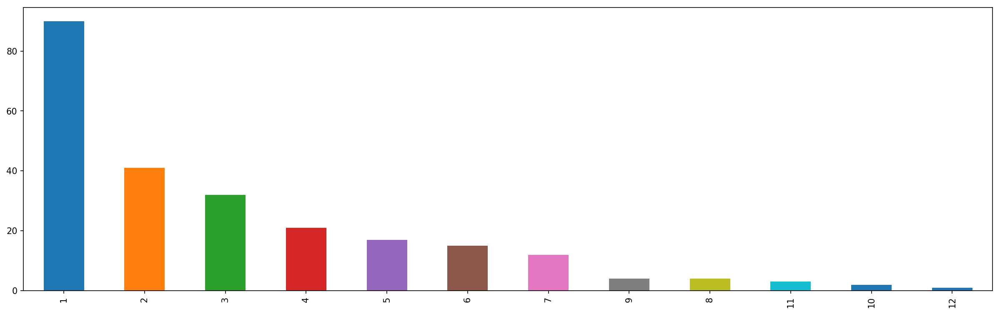

In [8]:
figure(num=None, figsize=(20, 6), dpi=150, facecolor='w', edgecolor='r')

values.plot.bar()

In [16]:
#MFCC

# 1. Get the file path to the included audio example
filename = librosa.util.example_audio_file()
path = "C:/Users/USER/Downloads/Tugas Akhir/dataset/buka.mp3"

# 2. Load the audio as a waveform `y`
#    Store the sampling rate as `sr`
y, sr = librosa.load(path,offset=48, duration=45) #load 45 and with same freq

mfcc = librosa.feature.mfcc(y=y, sr=sr, n_mfcc=13) #13 is default dimension frame 512

# mfcc_np = numpy.asarray(mfcc)
mfcc_to_csv = pandas.DataFrame(mfcc)
mfcc_to_csv.to_csv("mfcc.csv")

mfcc

array([[-1.97336186e+02, -2.01282210e+02, -2.08238013e+02, ...,
        -1.36704542e+02, -1.34773446e+02, -7.23945950e+01],
       [ 1.17652602e+02,  1.22659928e+02,  1.27818587e+02, ...,
         5.54088065e+01,  6.58926788e+01,  1.16049426e+02],
       [-1.16863772e+01, -1.60974759e+01, -1.76286316e+01, ...,
         3.50472712e+01,  3.59805022e+01,  1.76140426e+01],
       ...,
       [-6.85965524e+00, -1.80000464e+00,  1.39761905e+00, ...,
        -7.38684902e+00, -7.60303991e+00, -1.72494134e+00],
       [ 6.28876251e-01,  7.49775824e+00,  1.15568036e+01, ...,
         1.17609880e+01,  1.04517518e+01,  3.52370994e+00],
       [ 8.88357585e+00,  5.64002541e+00,  1.79767267e+00, ...,
        -5.01049168e-01,  2.42160659e-02, -2.95614370e+00]])

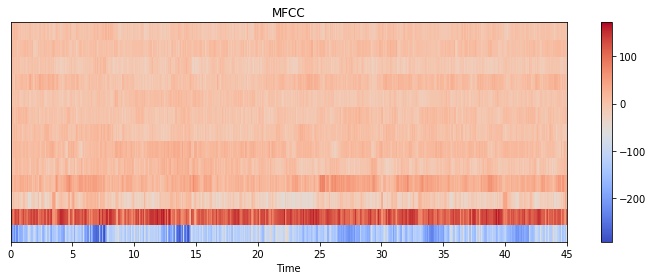

In [43]:
plt.figure(figsize=(10, 4))
librosa.display.specshow(mfcc, x_axis='time')
plt.colorbar()
plt.title('MFCC')
plt.tight_layout()

In [84]:
#CHROMAGRAM

# 1. Get the file path to the included audio example
filename = librosa.util.example_audio_file()
path = "C:/Users/USER/Downloads/Tugas Akhir/dataset/buka.mp3"

# 2. Load the audio as a waveform `y`
#    Store the sampling rate as `sr`
y, sr = librosa.load(path,offset=48, duration=45) #load 45 and with same freq

chroma = librosa.feature.chroma_stft(y=y, sr=sr, n_chroma=24) #24 is default dimension 512 frame

chroma_to_csv = pandas.DataFrame(chroma)
chroma_to_csv.to_csv("chroma.csv")

chroma

array([[0.23121522, 0.23937627, 0.23658949, ..., 0.67319054, 0.75286446,
        0.86893209],
       [0.12137454, 0.13211799, 0.12648423, ..., 0.77050328, 0.8470642 ,
        1.        ],
       [0.06005568, 0.07548332, 0.06596156, ..., 0.35662972, 0.33846872,
        0.79901981],
       ...,
       [1.        , 0.99512511, 0.9834911 , ..., 0.82894198, 0.82698343,
        0.57380858],
       [0.82382271, 0.80269637, 0.78629509, ..., 1.        , 1.        ,
        0.60672638],
       [0.45929668, 0.46243358, 0.46136221, ..., 0.82173792, 0.86294723,
        0.60601264]])

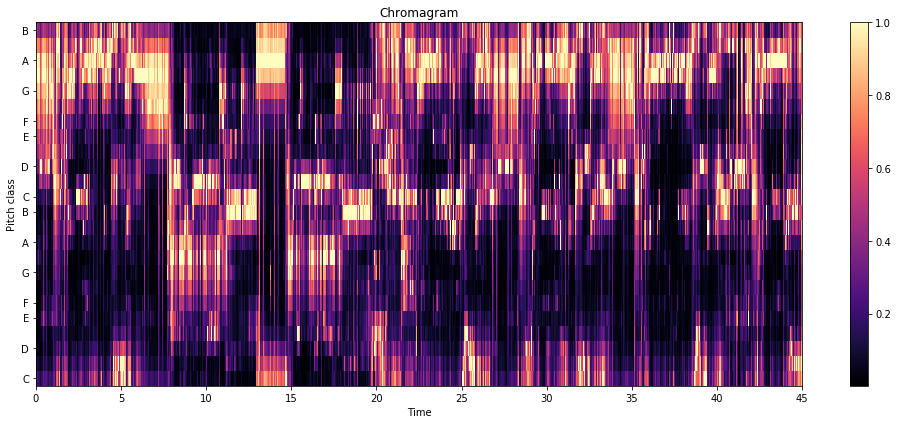

In [89]:
plt.figure(figsize=(14, 6))
librosa.display.specshow(chroma, y_axis='chroma', x_axis='time')
plt.colorbar()
plt.title('Chromagram')
plt.tight_layout()

In [14]:
#TIMBRE // CENTROID 

y, sr = librosa.load(librosa.util.example_audio_file())


# 1. Get the file path to the included audio example
filename = librosa.util.example_audio_file()
path = "C:/Users/USER/Downloads/Tugas Akhir/dataset/buka.mp3"

# 2. Load the audio as a waveform `y`
#    Store the sampling rate as `sr`
y, sr = librosa.load(path,offset=48, duration=45) #load 45 and with same freq

cent = librosa.feature.spectral_centroid(y=y, sr=sr) #1 is default dimension 512 frame

cent_to_csv = pandas.DataFrame(cent)
cent_to_csv.to_csv("cent.csv")

cent

array([[1545.59274135, 1478.31778153, 1450.68792938, ..., 3257.86333676,
        3091.54511256, 1649.1401255 ]])

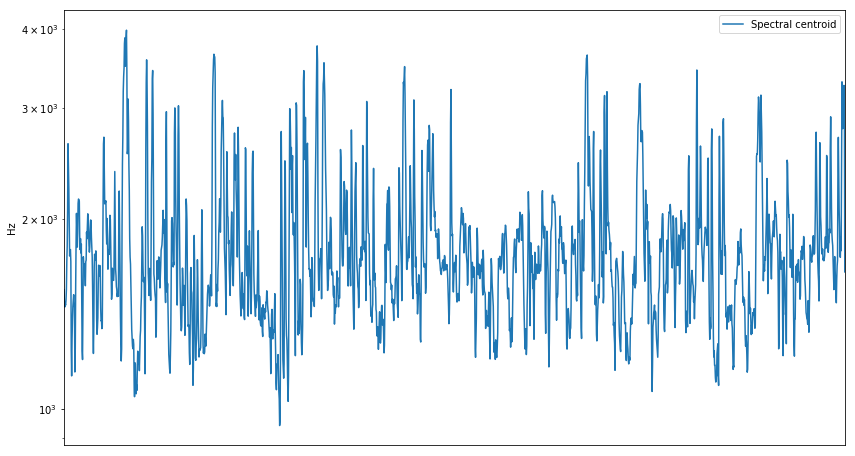

In [15]:
plt.figure(figsize=(14, 8))
plt.semilogy(cent.T, label='Spectral centroid')
plt.ylabel('Hz')
plt.xticks([])
plt.xlim([0, cent.shape[-1]])
plt.legend()

# plt.subplot(2, 1, 2)
# librosa.display.specshow(librosa.amplitude_to_db(S, ref=np.max),y_axis='log', x_axis='time')
# plt.title('log Power spectrogram')
# plt.tight_layout()

In [47]:
#TIMBRE // FLUX

# 1. Get the file path to the included audio example
filename = librosa.util.example_audio_file()
path = "C:/Users/USER/Downloads/Tugas Akhir/dataset/buka.mp3"

# 2. Load the audio as a waveform `y`
#    Store the sampling rate as `sr`
y, sr = librosa.load(path,offset=48, duration=45) #load 45 and with same freq

D = numpy.abs(librosa.stft(y)) #Short-time Fourier transform 
times = librosa.frames_to_time(numpy.arange(D.shape[1]))

onset_env = librosa.onset.onset_strength(y=y, sr=sr) #1 is default dimension 512 frame

flux_to_csv = pandas.DataFrame(onset_env)
flux_to_csv.to_csv("flux.csv")

onset_env

array([0.        , 0.        , 0.        , ..., 0.71962084, 1.04009033,
       0.54905217])

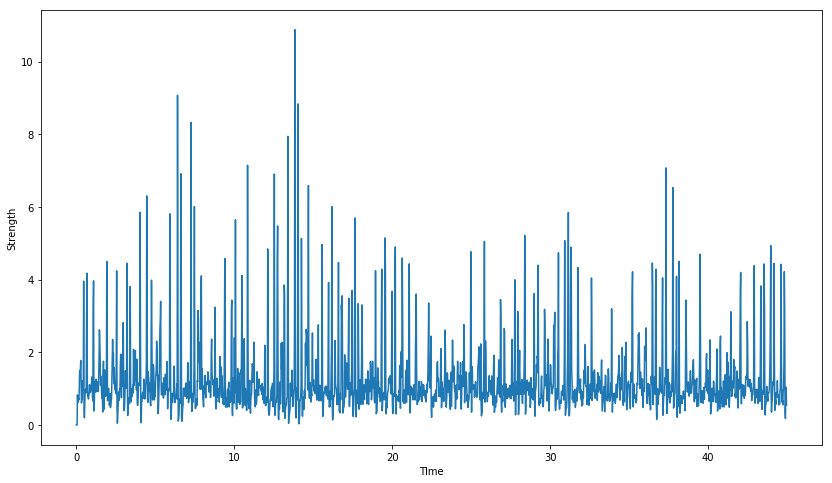

In [52]:
plt.figure(figsize=(14, 8))

plt.ylabel('Strength')
plt.xlabel('TIme')
plt.plot(times, onset_env, label='Mean (mel)')

In [53]:
#TIMBRE // ROllOFF

# 1. Get the file path to the included audio example
filename = librosa.util.example_audio_file()
path = "C:/Users/USER/Downloads/Tugas Akhir/dataset/buka.mp3"

# 2. Load the audio as a waveform `y`
#    Store the sampling rate as `sr`
y, sr = librosa.load(path,offset=48, duration=45) #load 45 and with same freq

D = numpy.abs(librosa.stft(y)) #Short-time Fourier transform 
times = librosa.frames_to_time(numpy.arange(D.shape[1]))

rolloff = librosa.feature.spectral_rolloff(y=y, sr=sr) #1 is default dimension 512 frame

rolloff_to_csv = pandas.DataFrame(rolloff)
rolloff_to_csv.to_csv("rolloff.csv")

rolloff # with 0.85 roll percent

array([[3552.97851562, 3316.11328125, 3186.9140625 , ..., 7105.95703125,
        7030.59082031, 3875.9765625 ]])

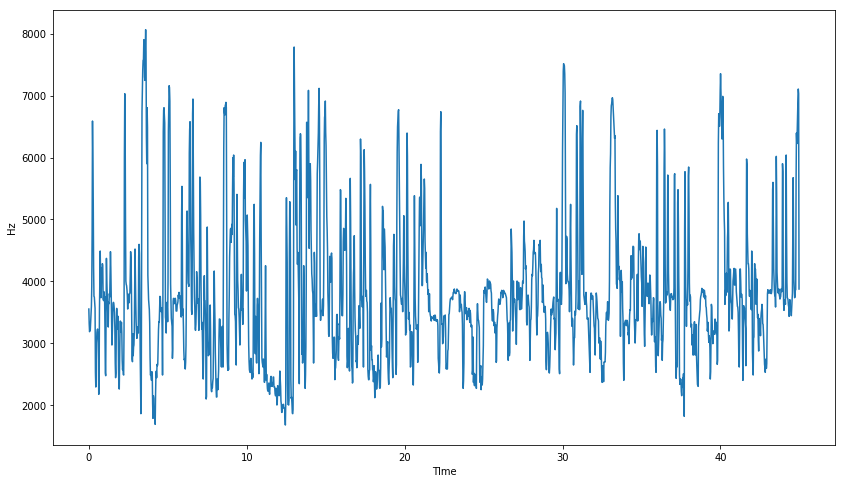

In [54]:
plt.figure(figsize=(14, 8))

plt.ylabel('Hz')
plt.xlabel('TIme')
plt.plot(times, rolloff.T,label='Roll-off frequency')

In [56]:
#TIMBRE // ZERO CROSSING

# 1. Get the file path to the included audio example
filename = librosa.util.example_audio_file()
path = "C:/Users/USER/Downloads/Tugas Akhir/dataset/buka.mp3"

# 2. Load the audio as a waveform `y`
#    Store the sampling rate as `sr`
y, sr = librosa.load(path,offset=48, duration=45) #load 45 and with same freq

D = numpy.abs(librosa.stft(y)) #Short-time Fourier transform 
times = librosa.frames_to_time(numpy.arange(D.shape[1]))

zc = librosa.feature.zero_crossing_rate(y) #1 is default dimension 512 frame

zc_to_csv = pandas.DataFrame(zc)
zc_to_csv.to_csv("zc.csv")

zc # with 0.85 roll percent

array([[0.015625  , 0.02246094, 0.02880859, ..., 0.10693359, 0.09765625,
        0.06640625]])

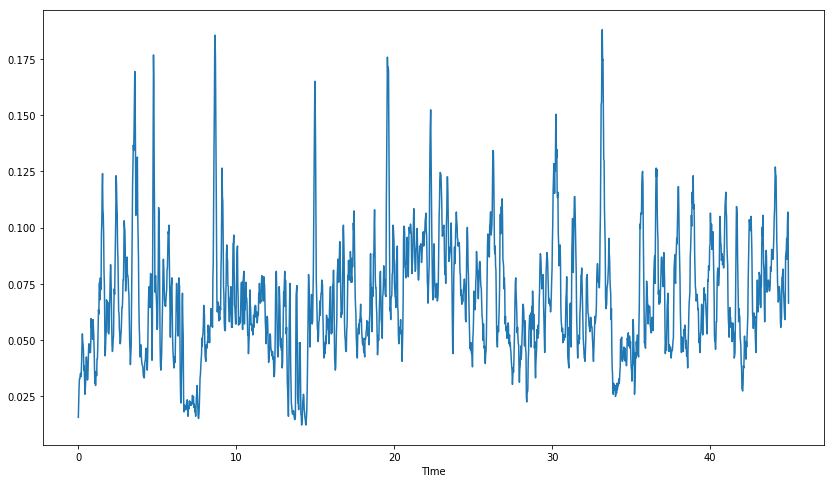

In [59]:
plt.figure(figsize=(14, 8))

# plt.ylabel('Hz')
plt.xlabel('TIme')
plt.plot(times, zc.T)

In [6]:
y, sr = librosa.load(path)
librosa.autocorrelate(y)

C:\Users\USER\Anaconda3\lib\site-packages\scipy\fftpack\basic.py:159: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  z[index] = x


array([ 5.6361820e+04,  5.4983395e+04,  5.2330469e+04, ...,
       -2.2659762e-05, -2.2825960e-05, -2.3080227e-05], dtype=float32)

Text(0.5,1,'Stereo')

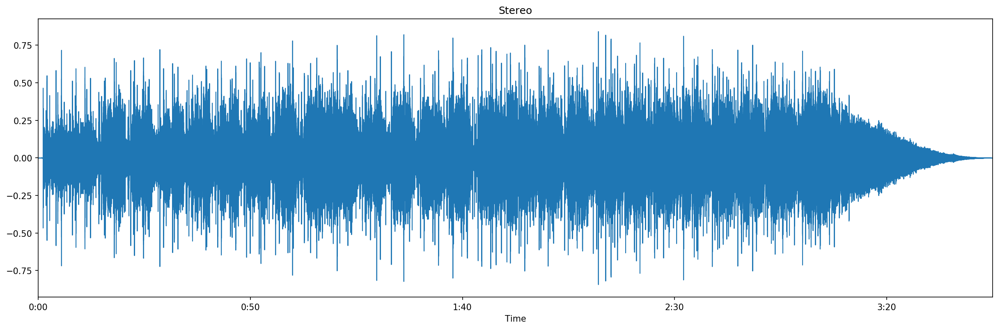

In [10]:
y, sr = librosa.load(path,sr=22500,mono=False)

plt.figure()
figure(num=None, figsize=(20, 6), dpi=150, facecolor='w', edgecolor='r')

librosa.display.waveplot(y, sr=sr)
plt.title('Stereo')

In [2]:
anno = pandas.read_csv('static_annotations.csv') # import ANEW

#anew[['Description','Valence Mean','Arousal Mean']].head()
anno.head()

,song_id,mean_arousal,std_arousal,mean_valence,std_valence
0,2,3.1,0.99443,3.0,0.66667
1,3,3.5,1.84090,3.3,1.70290
2,4,5.7,1.49440,5.5,1.71590
3,5,4.4,2.11870,5.3,1.94650
4,7,5.8,1.54920,6.4,1.77640


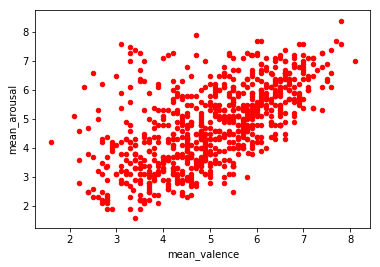

In [3]:
VA = anno.plot(kind='scatter',x='mean_valence',y='mean_arousal',color='red')
VA

In [17]:
aro = pandas.read_csv('arousal_cont_average.csv') # import ANEW

#anew[['Description','Valence Mean','Arousal Mean']].head()
aro.head()

,song_id,sample_15000ms,sample_15500ms,sample_16000ms,sample_16500ms,sample_17000ms,sample_17500ms,sample_18000ms,sample_18500ms,sample_19000ms,...,sample_40500ms,sample_41000ms,sample_41500ms,sample_42000ms,sample_42500ms,sample_43000ms,sample_43500ms,sample_44000ms,sample_44500ms,sample_45000ms
0,2,-0.109388,-0.114943,-0.116414,-0.118614,-0.126458,-0.133200,-0.136857,-0.144714,-0.138987,...,-0.259550,-0.262237,-0.261481,-0.264916,-0.265397,-0.265162,-0.264470,-0.265842,-0.267091,-0.266345
1,3,-0.110847,-0.123974,-0.131104,-0.135957,-0.140777,-0.144664,-0.163118,-0.165218,-0.158859,...,-0.265929,-0.263960,-0.263571,-0.262956,-0.260337,-0.248710,-0.245516,-0.251299,-0.254619,-0.259586
2,4,0.222328,0.179448,0.178389,0.184057,0.176043,0.178720,0.176345,0.175793,0.176155,...,0.298644,0.294144,0.302703,0.297487,0.303424,0.298097,0.304340,0.304115,0.305079,0.290705
3,5,-0.255613,-0.251578,-0.251957,-0.251123,-0.250762,-0.251957,-0.251957,-0.251957,-0.251957,...,-0.225898,-0.228913,-0.228913,-0.228913,-0.228913,-0.227561,-0.227609,-0.229996,-0.243920,-0.246009
4,7,0.464233,0.460788,0.460990,0.461046,0.457239,0.465701,0.471808,0.469918,0.473376,...,0.333163,0.331243,0.333927,0.333740,0.340782,0.339002,0.339271,0.340961,0.342020,0.335976


In [18]:
val = pandas.read_csv('valence_cont_average.csv') # import ANEW

#anew[['Description','Valence Mean','Arousal Mean']].head()
val.head()

,song_id,sample_15000ms,sample_15500ms,sample_16000ms,sample_16500ms,sample_17000ms,sample_17500ms,sample_18000ms,sample_18500ms,sample_19000ms,...,sample_40500ms,sample_41000ms,sample_41500ms,sample_42000ms,sample_42500ms,sample_43000ms,sample_43500ms,sample_44000ms,sample_44500ms,sample_45000ms
0,2,-0.073341,-0.074662,-0.074078,-0.078155,-0.081589,-0.080875,-0.083612,-0.082146,-0.081633,...,-0.324848,-0.324682,-0.328113,-0.330134,-0.330135,-0.331165,-0.331769,-0.334287,-0.333847,-0.334209
1,3,-0.189701,-0.187763,-0.183738,-0.188760,-0.193703,-0.190832,-0.189039,-0.197552,-0.202871,...,-0.313982,-0.305432,-0.294849,-0.282939,-0.276366,-0.279426,-0.278661,-0.274246,-0.270161,-0.263900
2,4,0.154287,0.148063,0.146956,0.151180,0.135941,0.076832,0.084486,0.088514,0.090945,...,0.217566,0.218894,0.222273,0.190337,0.173085,0.174891,0.179883,0.182709,0.179331,0.178671
3,5,0.149054,0.148261,0.147370,0.146957,0.147857,0.146928,0.145652,0.145796,0.146421,...,0.133478,0.133478,0.134290,0.133556,0.134593,0.134348,0.133955,0.133478,0.133478,0.133478
4,7,0.342818,0.345193,0.332023,0.328888,0.327603,0.329013,0.327885,0.334824,0.328449,...,0.327612,0.330914,0.331320,0.301550,0.295277,0.295031,0.319244,0.316518,0.321732,0.307598


In [34]:
val.shape

(744, 62)

In [67]:
x = val.iloc[0:1]
x

# y = aro.iloc[0]

# VA_cont = plt.scatter(x=x,y=y,color='red')
# VA_cont

,song_id,sample_15000ms,sample_15500ms,sample_16000ms,sample_16500ms,sample_17000ms,sample_17500ms,sample_18000ms,sample_18500ms,sample_19000ms,...,sample_40500ms,sample_41000ms,sample_41500ms,sample_42000ms,sample_42500ms,sample_43000ms,sample_43500ms,sample_44000ms,sample_44500ms,sample_45000ms
0,2,-0.073341,-0.074662,-0.074078,-0.078155,-0.081589,-0.080875,-0.083612,-0.082146,-0.081633,...,-0.324848,-0.324682,-0.328113,-0.330134,-0.330135,-0.331165,-0.331769,-0.334287,-0.333847,-0.334209


In [ ]:
# 1. Get the file path to the included audio example
filename = librosa.util.example_audio_file()
path = "C:/Users/USER/Downloads/Tugas Akhir/dataset/buka.mp3"
# path

# 2. Load the audio as a waveform `y`
#    Store the sampling rate as `sr`
y, sr = librosa.load(path,offset=48, duration=45) #load 45 and with same freq

mfcc = librosa.feature.mfcc(y=y, sr=sr, n_mfcc=13)

mfcc_np = numpy.asarray(mfcc)
# mfcc_to_csv = pandas.DataFrame(mfcc)
# mfcc_to_csv.to_csv("mfcc.csv")

print(mfcc)
# # 3. Run the default beat tracker
# tempo, beat_frames = librosa.beat.beat_track(y=y, sr=sr)
# # tempo

# print('Estimated tempo: {:.2f} beats per minute'.format(tempo))

# # 4. Convert the frame indices of beat events into timestamps
# beat_times = librosa.frames_to_time(beat_frames, sr=sr)

# print('Saving output to beat_times.csv')
# librosa.output.times_csv('beat_times.csv', beat_times)

# S = librosa.stft(y)
# matrix = librosa.get_duration(S=S, sr=sr)

# matrix


# y, sr = librosa.load(librosa.util.example_audio_file(), offset=30, duration=5)
